# ELG7186 - Fall 2022 - Assignment 2
## Due: <strong>Wednesday November 2<sup>th</sup> 2022 -- 11:59pm</strong>

The purpose of this assignment is to gain experience building and training neural networks. You will learn:
- Design and train a fully-connected neural network
- Train an existing CNN architecture using fine-tuning
- Visualize the trained model


### Submission Details
Submit your Jupyter notebook .ipynb file using Brightspace. Do not include any other files or images as they will not be reviewed.
<p>
<strong>Make certain that you run all the cells in the notebook you submit</strong> or you will loose marks.
</p>
<ul>
<li>You can submit multiple times, but only the most recent submission will be saved</li>
<li>Do not wait until the last minute to submit in case you have an unexpected issue</li>
<li>Review the late policy in the syllabus</li>
<li><strong>You must submit your own work</strong> and abide by the University of Ottawa policy on plagiarism and fraud</li>
</ul>

### DO NOT submit any images from the dataset

## Part 0. Data Preparation

To complete the assignment you will download the Caltech Bird dataset and devise an appropriate training set split. <b>You are free to sample from the dataset to reduce the overal training samples depending on your access to compute.</b> Again, the overall accuracy is less important than your  observations and comparisons.

Dataset: <a href="http://www.vision.caltech.edu/visipedia/CUB-200-2011.html">Caltech-UCSD Birds-200-2011</a> (Also posed on Brightspace)

The dataset contains annotations for various tasks. In this assignment you will use the categories for classification (species labels)

In this section:
<ul>
<li>Download the dataset as described above</li>
<li>Create your splits for your dataset (there is a split provided for the full dataset) </li>
<li>Visualize five samples of each class by plotting a grid using the matplotlib library.</li>
</ul>

## Download the data

In [153]:
!pip install gdown
!gdown --id 1Z0nWCnh9JyslxRRMAGU4vWhidINJn2VU

c:\users\kirolos\appdata\local\programs\python\python39\lib\site-packages\gdown\cli.py:127: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1Z0nWCnh9JyslxRRMAGU4vWhidINJn2VU
To: E:\Projects\Computer vision DEBI\Assignments\Assignment 2\CUB_200_2011.tgz

  0%|          | 0.00/1.15G [00:00<?, ?B/s]
  0%|          | 524k/1.15G [00:00<06:51, 2.80MB/s]
  0%|          | 1.57M/1.15G [00:00<03:27, 5.52MB/s]
  0%|          | 2.62M/1.15G [00:00<02:43, 7.03MB/s]
  0%|          | 3.67M/1.15G [00:00<03:17, 5.80MB/s]
  1%|          | 5.77M/1.15G [00:00<02:15, 8.42MB/s]
  1%|          | 6.82M/1.15G [00:01<02:59, 6.39MB/s]
  1%|          | 7.86M/1.15G [00:01<03:01, 6.28MB/s]
  1%|          | 9.96M/1.15G [00:01<02:16, 8.38MB/s]
  1%|          | 11.0M/1.15G [00:01<02:30, 7.57MB/s]
  1%|1         | 12.6M/1.15G [00:01<02:05, 9.09MB/s]
  1%|1     

## Extract the data

In [155]:
# importing the "tarfile" module
import tarfile

# open file
file = tarfile.open('CUB_200_2011.tgz')

# extracting file
file.extractall()

file.close()

In [156]:
from keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
import torch
import numpy as np
import random
import os
photo_size=32

In [157]:
def set_seed(seed=42):
    # Set a fixed value for python
    np.random.seed(seed)
    random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    # Set a fixed value for torch
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    # When running on the CuDNN backend, two further options must be set
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    # Set a fixed value for tensorflow
    tf.random.set_seed(seed)
    tf.experimental.numpy.random.seed(seed)
    tf.random.set_seed(seed)
    # When running on the CuDNN backend, two further options must be set
    os.environ['TF_CUDNN_DETERMINISTIC'] = '1'
    os.environ['TF_DETERMINISTIC_OPS'] = '1'
    print(f"Random seed set as {seed}")

seed=96
set_seed(seed)

Random seed set as 96


## After reading the data description, there are file that contains the bounding boxes for image cropping which removes some of the unnecessary background and gives the model more foucus into the bird's features.

## Image Cropping

In [158]:
get_image_id_from_path={}
with open ('CUB_200_2011/images.txt','r') as f :
    for line in f.readlines():
        l=line.split(' ')
        get_image_id_from_path[l[1][:-1]]=l[0]
get_bound_box_from_id={}
with open ('CUB_200_2011/bounding_boxes.txt','r') as f :
    for line in f.readlines():
        l=line.split(' ')
        get_bound_box_from_id[l[0]]=[float(l[1]),float(l[2]),float(l[3]),float(l[4][:-1])]

In [159]:
import cv2
import os
import numpy as np
main_path= 'CUB_200_2011/images'
for folder in os.listdir(main_path):
    full_image_path=os.path.join(main_path, folder)
    for image in os.listdir(full_image_path):
        image_path=os.path.join(folder,image)
        image_path=image_path.replace('\\','/')
        image_id=get_image_id_from_path[image_path]
        img=cv2.imread(os.path.join(full_image_path,image))
        # initiate a black image
        black_image=np.zeros((img.shape),dtype='uint8')
        # Get the bounding boxes dimentions
        points=get_bound_box_from_id[image_id]
        first_point=(int(points[0]),int(points[1]))
        second_point=(int(points[0])+int(points[2]),int(points[1])+int(points[3]))
        # create a mask for cropping
        cv2.rectangle(black_image,first_point,second_point,color=(255,255,255),thickness=-1)
        cropped=cv2.bitwise_and(black_image,img)
        #remove the original and save the cropped version
        os.remove(os.path.join(full_image_path,image))
        cv2.imwrite(os.path.join(full_image_path,image),cropped)

## Train test split

In [160]:
import shutil
import os
import numpy as np
def get_files_from_folder(path):
    files = os.listdir(path)
    return np.asarray(files)


def image_train_test_split(path_to_data, path_to_test_data, train_ratio):
    # get dirs
    _, dirs, _ = next(os.walk(path_to_data))

    # calculates how many train data per class
    data_counter_per_class = np.zeros((len(dirs)))
    for i in range(len(dirs)):
        path = os.path.join(path_to_data, dirs[i])
        files = get_files_from_folder(path)
        data_counter_per_class[i] = len(files)
    test_counter = np.round(data_counter_per_class * (1 - train_ratio))

    # transfers files
    for i in range(len(dirs)):
        path_to_original = os.path.join(path_to_data, dirs[i])
        path_to_save = os.path.join(path_to_test_data, dirs[i])

        #creates dir
        if not os.path.exists(path_to_save):
            os.makedirs(path_to_save)
        files = get_files_from_folder(path_to_original)
        # moves data
        for j in range(int(test_counter[i])):
            dst = os.path.join(path_to_save, files[j])
            src = os.path.join(path_to_original, files[j])
            shutil.move(src, dst)

## Create folders for Test and rename the original to Train

In [161]:
if 'Test' not in os.listdir('CUB_200_2011'):
    os.makedirs('CUB_200_2011/Test')
    image_train_test_split(path_to_data='CUB_200_2011/images', path_to_test_data='CUB_200_2011/Test', train_ratio=float(0.8))
if 'Train' not in os.listdir('CUB_200_2011'):
    os.rename('CUB_200_2011/images','CUB_200_2011/Train')

## Load the data using Image generator

In [162]:
def prepare_dataset(data_dir,target_size,batch_size):
    datagen = ImageDataGenerator(
        rescale=1 / 255,

    )
    generator = datagen.flow_from_directory(
        data_dir,
        target_size=(target_size,target_size),
        class_mode='categorical',
        batch_size=batch_size,
    )
    return generator
train_data_32=prepare_dataset('CUB_200_2011/Train',photo_size,1024)
test_data_32=prepare_dataset('CUB_200_2011/Test',photo_size,1024)

Found 9422 images belonging to 200 classes.
Found 2366 images belonging to 200 classes.


In [4]:
mapping_dict=dict()
for key in train_data_32.class_indices.keys():
    mapping_dict[train_data_32.class_indices[key]]=key
import pickle
a_file = open("Mapping_results_32.pkl", "wb")
pickle.dump(mapping_dict, a_file)
a_file.close()
print('Saved')

Saved


## Visualize five samples of each class by plotting a grid using the matplotlib library

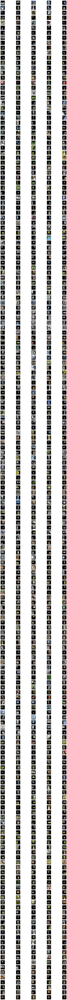

In [10]:
import matplotlib.pyplot as plt
from PIL import Image
samples=[]
for i,folder in enumerate(os.listdir('CUB_200_2011/Train')):
    inner_path=os.path.join('CUB_200_2011/Train',folder)
    rand_images=random.sample(os.listdir(inner_path),k=5)
    for image in rand_images:
        inner_inner_path=os.path.join(inner_path,image)
        img=Image.open(inner_inner_path)
        img=img.resize((200,200))
        samples.append(img)

n_row,n_col=(200,5)
_, axs = plt.subplots(n_row, n_col, figsize=(15, 200))
axs = axs.flatten()
for img, ax in zip(samples, axs):
    ax.imshow(img)
    ax.grid(False)
    ax.axis(False)

## Part 1. Perceptron (3 Marks)
For this section you will implement a fully connected neural network (multi-layer perceptron). To do this you will need to perform the following steps:
- Resize the images to be no larger than 32x32.
- Use the sequential model API in keras to build your network using dense layers (consider performance impacts of fully connected layers)
- You must decide an appropriate number of neurons and layers.
- Print a summary of your model configuration.


When your classifier is working:
- Plot a loss curve for training and test data
- Plot an accuracy curve for training and test data
- Provide a brief discussion of your results

## Resizing step has been done in Image generator

## Neural network Model (only Dense layers)

In [12]:
from keras.optimizers import Adam
# Write your FC network code here
from keras.models import Sequential
from keras import layers
from keras.optimizers import adam_v2
from keras.optimizers import RMSprop

model=Sequential([
    layers.InputLayer(input_shape=(photo_size,photo_size,3)),
    layers.Flatten(),# Flatten the data to be able to use in MLP
    layers.BatchNormalization(),
    layers.Dense(units=1024,activation='relu'),
    layers.Dropout(0.3),
    layers.BatchNormalization(),
    layers.Dense(units=512,activation='relu',),
    layers.Dense(units=512,activation='relu',),
    layers.Dropout(0.3),
    layers.BatchNormalization(),
    layers.Dense(units=128,activation='relu',),
    layers.Dense(units=128,activation='relu',),
    layers.Dropout(0.5),
    layers.Dense(units=200,activation='softmax',),
])

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 3072)              0         
                                                                 
 batch_normalization_3 (Batc  (None, 3072)             12288     
 hNormalization)                                                 
                                                                 
 dense_6 (Dense)             (None, 1024)              3146752   
                                                                 
 dropout_3 (Dropout)         (None, 1024)              0         
                                                                 
 batch_normalization_4 (Batc  (None, 1024)             4096      
 hNormalization)                                                 
                                                                 
 dense_7 (Dense)             (None, 512)              

## Training sequential model

In [14]:
checkpoint_filepath = 'model_Checkpoints/'
num_of_epochs=30
import tensorflow as tf
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)
model_early_stopping_callback=tf.keras.callbacks.EarlyStopping(
    monitor="val_accuracy",
    patience=15,
    verbose=0,
    mode="max",
)

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.fit(train_data_32,validation_data= test_data_32,  epochs=30, verbose=1)

mlp_history = model.fit(train_data_32,
                        epochs = num_of_epochs
                        , callbacks=[model_checkpoint_callback,
                                                        model_early_stopping_callback
                                                       ]
                        , validation_data=test_data_32)
# The model weights (that are considered the best) are loaded into the model.
model.load_weights(checkpoint_filepath)
model.save("model_v1.h5")
print('saved')

Epoch 1/30
10/10 [==============================] - 21s 2s/step - loss: 2.7868 - accuracy: 0.2921 - val_loss: 5.6353 - val_accuracy: 0.0427
Epoch 2/30
10/10 [==============================] - 15s 2s/step - loss: 2.6898 - accuracy: 0.3203 - val_loss: 5.7021 - val_accuracy: 0.0418
Epoch 3/30
10/10 [==============================] - 19s 2s/step - loss: 2.5916 - accuracy: 0.3354 - val_loss: 5.8505 - val_accuracy: 0.0414
Epoch 4/30
10/10 [==============================] - 19s 2s/step - loss: 2.5191 - accuracy: 0.3548 - val_loss: 5.8431 - val_accuracy: 0.0495
Epoch 5/30
10/10 [==============================] - 17s 2s/step - loss: 2.4327 - accuracy: 0.3666 - val_loss: 5.9154 - val_accuracy: 0.0452
Epoch 6/30
10/10 [==============================] - 19s 2s/step - loss: 2.3819 - accuracy: 0.3799 - val_loss: 6.0081 - val_accuracy: 0.0448
Epoch 7/30
10/10 [==============================] - 20s 2s/step - loss: 2.2860 - accuracy: 0.3983 - val_loss: 6.0961 - val_accuracy: 0.0431
Epoch 8/30
10/10 [==

## Plot a loss curve for training and test data

Text(0.5, 1.0, 'Training and testing losses during the training')

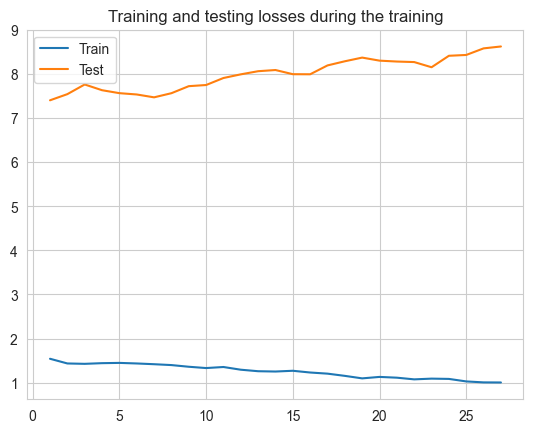

In [15]:
import seaborn as sns
sns.lineplot(x=range(1,27+1),y=mlp_history.history['loss'],label='Train')
sns.lineplot(x=range(1,27+1),y=mlp_history.history['val_loss'],label='Test').set_title('Training and testing losses during the training')

## Plot an accuracy curve for training and test data

Text(0.5, 1.0, 'Training and testing accuracies during the training')

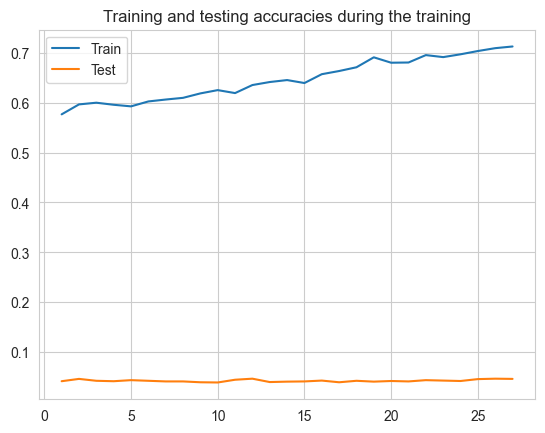

In [17]:
sns.lineplot(x=range(1,27+1),y=mlp_history.history['accuracy'],label='Train')
sns.lineplot(x=range(1,27+1),y=mlp_history.history['val_accuracy'],label='Test').set_title('Training and testing accuracies during the training')

### Brief Discussion of the results

this model is over-fitted on the training data and can't generalize on the testing data.
Dealing with image as flattened array is poor representation and Dense layers can't find the appreciate features to extract, so this is the reason of low accuracy results.

## Part 2. ResNet-101 (4 Marks)

For this section you will adapt the ResNet-101 network for the current task using tranfer learning and fine-tuning. You will implement the following in your process:
- You should choose a suitable image size.
- Choose a suitable labelling scheme.
- Use the pretrained ResNet-101 network available in Keras.
- Remove the top fully connected layers. Include your own FC layers that match our dataset.
- Choose some layers to "freeze" and the remaining layers you will fine-tune with the new dataset.

### Step 1
You will use the above steps to train a ResNet-101 model using the Bird dataset
- Use transfer learning to train your first model by removing the FC layers, but leaving the other layers intact.
- Plot a loss curve for training and test data
- Plot an accuracy curve for training and test data

### Step 2
Now use the same steps as above, but this time unfreeze some convolutional layers and retrain the network. Again, plot your results.

### Step 3
Discuss the results of both methods from step 1 and step 2 while using plots and graphics to support your discussion.

## Prepare the data for resNet

In [18]:
photo_size=224
train_data_200=prepare_dataset('CUB_200_2011/Train',photo_size,64)
test_data_200=prepare_dataset('CUB_200_2011/Test',photo_size,64)

Found 9422 images belonging to 200 classes.
Found 2366 images belonging to 200 classes.


## Step 1 freezed model

In [27]:
from keras.applications import ResNet101,ResNet101V2
from keras.models import Model
resnet_model=ResNet101V2(include_top=False,weights='imagenet',input_shape=(photo_size,photo_size,3))
resnet_model.trainable=False
x=resnet_model.output
x=layers.GlobalAveragePooling2D()(x)
x=layers.Flatten()(x)
x=layers.BatchNormalization()(x)
x=layers.Dense(units=1024,activation='relu')(x)
x=layers.Dropout(0.5)(x)
x=layers.Dense(units=64,activation='relu')(x)
x=layers.Dropout(0.4)(x)
output=layers.Dense(units=200,activation='softmax')(x)
fine_tuned_resnet_model_freezed = Model(resnet_model.input, output)
fine_tuned_resnet_model_freezed.compile(optimizer=Adam(learning_rate=0.001),loss='categorical_crossentropy',metrics=['accuracy'])
fine_tuned_resnet_model_freezed.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_9[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

## Training

In [28]:
import tensorflow as tf

checkpoint_filepath = 'resnet_freezed_Checkpoints/'
num_of_epochs=50
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)
model_early_stopping_callback=tf.keras.callbacks.EarlyStopping(
    monitor="val_accuracy",
    patience=5,
    verbose=0,
    mode="max",
)

resnet_history_freezed = fine_tuned_resnet_model_freezed.fit(train_data_200,
                        epochs = num_of_epochs
                        , callbacks=[model_checkpoint_callback,
                                                        model_early_stopping_callback
                                                       ]
                        , validation_data=test_data_200)
# The model weights (that are considered the best) are loaded into the model.
fine_tuned_resnet_model_freezed.load_weights(checkpoint_filepath)
fine_tuned_resnet_model_freezed.save("resnet_model_v1_freezed.h5")
print('saved')

Epoch 1/50
148/148 [==============================] - 196s 1s/step - loss: 4.9478 - accuracy: 0.0465 - val_loss: 4.1438 - val_accuracy: 0.1746
Epoch 2/50
148/148 [==============================] - 189s 1s/step - loss: 3.9969 - accuracy: 0.1439 - val_loss: 3.2682 - val_accuracy: 0.2658
Epoch 3/50
148/148 [==============================] - 188s 1s/step - loss: 3.3846 - accuracy: 0.2099 - val_loss: 2.8183 - val_accuracy: 0.3301
Epoch 4/50
148/148 [==============================] - 187s 1s/step - loss: 3.0181 - accuracy: 0.2671 - val_loss: 2.5589 - val_accuracy: 0.3715
Epoch 5/50
148/148 [==============================] - 187s 1s/step - loss: 2.7356 - accuracy: 0.3136 - val_loss: 2.3493 - val_accuracy: 0.3969
Epoch 6/50
148/148 [==============================] - 188s 1s/step - loss: 2.5238 - accuracy: 0.3447 - val_loss: 2.2537 - val_accuracy: 0.4083
Epoch 7/50
148/148 [==============================] - 188s 1s/step - loss: 2.3443 - accuracy: 0.3708 - val_loss: 2.2171 - val_accuracy: 0.4260

## Plot a loss curve for training and test data

Text(0.5, 1.0, 'Training and testing losses during the training')

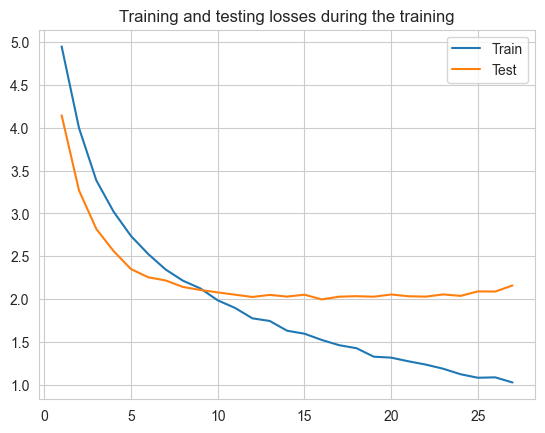

In [29]:
import seaborn as sns
sns.lineplot(x=range(1,27+1),y=resnet_history_freezed.history['loss'],label='Train')
sns.lineplot(x=range(1,27+1),y=resnet_history_freezed.history['val_loss'],label='Test').set_title('Training and testing losses during the training')

## Plot an accuracy curve for training and test data

Text(0.5, 1.0, 'Training and testing accuracies during the training')

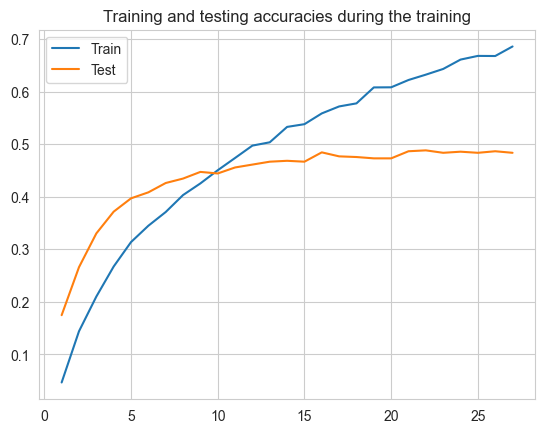

In [31]:
sns.lineplot(x=range(1,27+1),y=resnet_history_freezed.history['accuracy'],label='Train')
sns.lineplot(x=range(1,27+1),y=resnet_history_freezed.history['val_accuracy'],label='Test').set_title('Training and testing accuracies during the training')

## Step 2 unfreezed model

## Read the data again with different batch size to can train this network with our memory size

In [32]:
photo_size=224
train_data_200=prepare_dataset('CUB_200_2011/Train',photo_size,8)
test_data_200=prepare_dataset('CUB_200_2011/Test',photo_size,8)

Found 9422 images belonging to 200 classes.
Found 2366 images belonging to 200 classes.


### Freeze some of the first layers and let the other learning from the new data

In [42]:
from keras.applications import ResNet101,ResNet101V2
from keras.models import Model
resnet_model=ResNet101V2(include_top=False,weights='imagenet',input_shape=(photo_size,photo_size,3))
# freeze some of the first layers and let the other learning from the new data
for layer in resnet_model.layers[:-35] :
    layer.trainable=False
x=resnet_model.output
x=layers.GlobalAveragePooling2D()(x)
x=layers.Flatten()(x)
x=layers.BatchNormalization()(x)
x=layers.Dense(units=128,activation='swish')(x)
x=layers.BatchNormalization()(x)
x=layers.Dropout(0.5)(x)
x=layers.Dense(units=64,activation='swish')(x)
x=layers.Dropout(0.4)(x)
output=layers.Dense(units=200,activation='softmax')(x)
fine_tuned_resnet_model_unfreezed = Model(resnet_model.input, output)
fine_tuned_resnet_model_unfreezed.compile(optimizer=Adam(learning_rate=0.001),loss='categorical_crossentropy',metrics=['accuracy'])
fine_tuned_resnet_model_unfreezed.summary()

Model: "model_14"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_18 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_18[0][0]']               
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

## Training

In [ ]:
import tensorflow as tf

checkpoint_filepath = 'resnet_unfreezed_Checkpoints/'
num_of_epochs=50
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)
model_early_stopping_callback=tf.keras.callbacks.EarlyStopping(
    monitor="val_accuracy",
    patience=15,
    verbose=0,
    mode="max",
)

resnet_history_unfreezed = fine_tuned_resnet_model_unfreezed.fit(train_data_200,
                        epochs = num_of_epochs
                        , callbacks=[model_checkpoint_callback,
                                                        model_early_stopping_callback
                                                       ]
                        , validation_data=test_data_200)
# The model weights (that are considered the best) are loaded into the model.
fine_tuned_resnet_model_unfreezed.load_weights(checkpoint_filepath)
fine_tuned_resnet_model_unfreezed.save("resnet_model_v1_unfreezed.h5")
print('saved')

Epoch 1/50
1178/1178 [==============================] - 298s 247ms/step - loss: 5.4322 - accuracy: 0.0057 - val_loss: 5.5234 - val_accuracy: 0.0114
Epoch 2/50
1178/1178 [==============================] - 285s 242ms/step - loss: 5.1516 - accuracy: 0.0114 - val_loss: 5.2261 - val_accuracy: 0.0178
Epoch 3/50
1178/1178 [==============================] - 283s 240ms/step - loss: 4.9122 - accuracy: 0.0171 - val_loss: 4.6217 - val_accuracy: 0.0321
Epoch 4/50
1178/1178 [==============================] - 283s 240ms/step - loss: 4.6907 - accuracy: 0.0215 - val_loss: 4.3378 - val_accuracy: 0.0482
Epoch 5/50
1178/1178 [==============================] - 285s 242ms/step - loss: 4.5451 - accuracy: 0.0354 - val_loss: 5.0033 - val_accuracy: 0.0524
Epoch 6/50
1178/1178 [==============================] - 281s 239ms/step - loss: 4.2889 - accuracy: 0.0495 - val_loss: 3.6958 - val_accuracy: 0.1306
Epoch 7/50
1178/1178 [==============================] - 285s 242ms/step - loss: 3.9319 - accuracy: 0.0745 - val_

## Plot a loss curve for training and test data

Text(0.5, 1.0, 'Training and testing losses during the training')

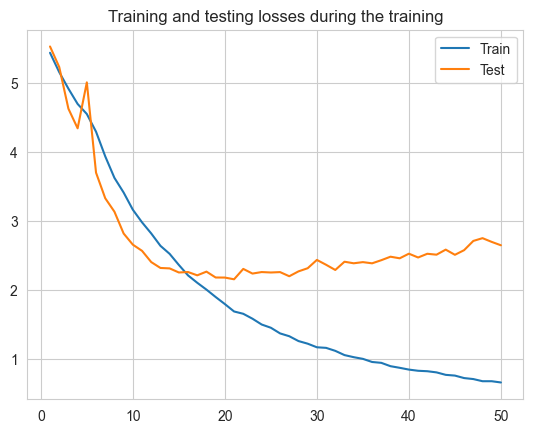

In [45]:
sns.lineplot(x=range(1,num_of_epochs+1),y=resnet_history_unfreezed.history['loss'],label='Train')
sns.lineplot(x=range(1,num_of_epochs+1),y=resnet_history_unfreezed.history['val_loss'],label='Test').set_title('Training and testing losses during the training')

## Plot an accuracy curve for training and test data

Text(0.5, 1.0, 'Training and testing accuracies during the training')

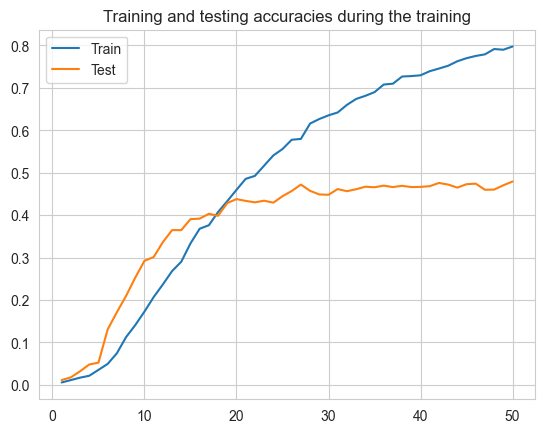

In [46]:
sns.lineplot(x=range(1,num_of_epochs+1),y=resnet_history_unfreezed.history['accuracy'],label='Train')
sns.lineplot(x=range(1,num_of_epochs+1),y=resnet_history_unfreezed.history['val_accuracy'],label='Test').set_title('Training and testing accuracies during the training')

## Step 3 Discuss the results of both methods from step 1 and step 2 while using plots and graphics to support your discussion.

## Comparison between freezed and unfreezed models

296/296 [==============================] - 44s 148ms/step - loss: 2.6433 - accuracy: 0.4793


<AxesSubplot:>

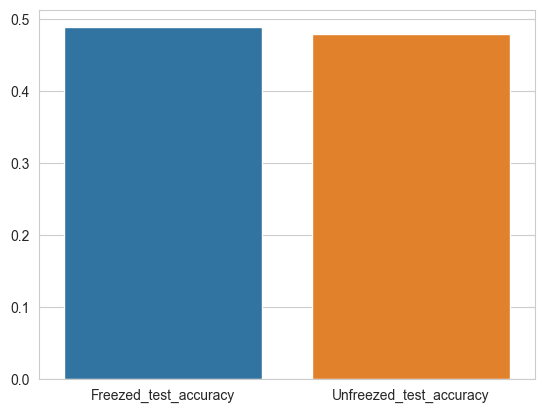

In [11]:
import seaborn as sns
freezed_test_acc=fine_tuned_resnet_model_freezed.evaluate(test_data_200)[1]
unfreezed_test_acc=fine_tuned_resnet_model_unfreezed.evaluate(test_data_200)[1]
sns.barplot(x=['Freezed_test_accuracy','Unfreezed_test_accuracy'],y=[freezed_test_acc,unfreezed_test_acc])

**From this graph we can deduce that transfer learning method is the winner and the model exploited the pre-trained weights to gives us good accuracy.**

## Comparison through over-fitting

1178/1178 [==============================] - 177s 150ms/step - loss: 0.0225 - accuracy: 0.9980


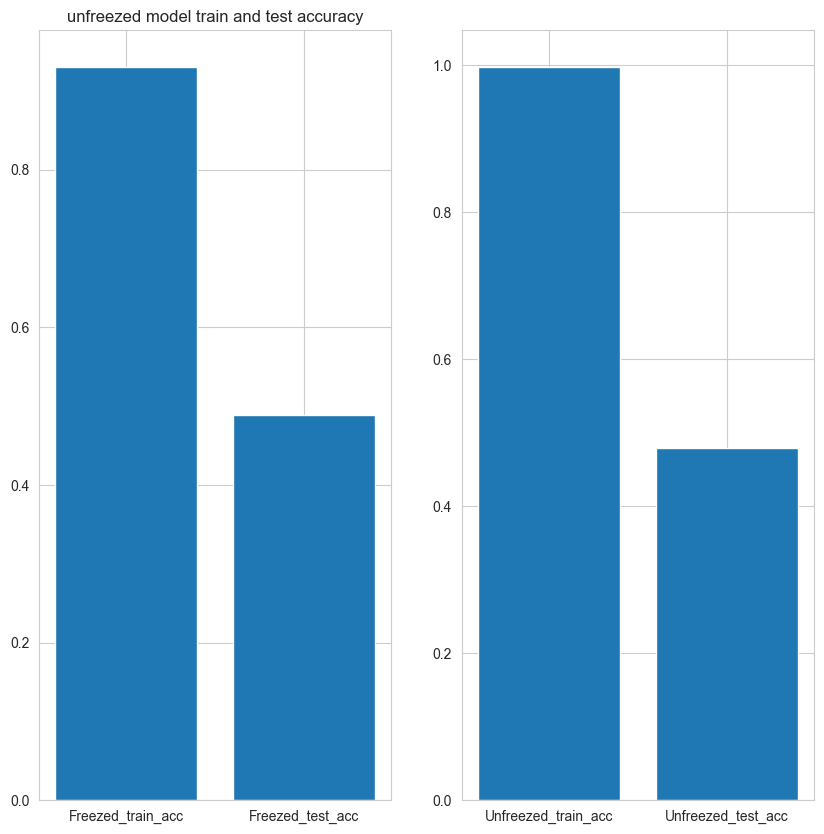

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt
freezed_train_acc=fine_tuned_resnet_model_freezed.evaluate(train_data_200)[1]
unfreezed_train_acc=fine_tuned_resnet_model_unfreezed.evaluate(train_data_200)[1]
fig,axes=plt.subplots(1,2,figsize=(10,10))
ax=axes.flatten()
ax[0].bar(['Freezed_train_acc','Freezed_test_acc'],[freezed_train_acc,freezed_test_acc])
ax[0].title.set_text('freezed model train and test accuracy')
ax[1].bar(['Unfreezed_train_acc','Unfreezed_test_acc'],[unfreezed_train_acc,unfreezed_test_acc])
ax[0].title.set_text('unfreezed model train and test accuracy')
plt.show()

**The two models are overfitted,but the freezed model is better in this cases**

## Part 3. Visualization (3 Marks)

For this section you will visualize the filters learned byyour ResNet-101 network and use t-SNE to observe clusters that were learned by your model.
- Make sure to provide the graphic results for your visualizations
- Provide an interpretation of the results

## Visualization of filters
Visualize the filters from the first conv layer which contins filters of shape (7,7) and draw each channel in a graph

conv1_conv
(7, 7, 3, 64)


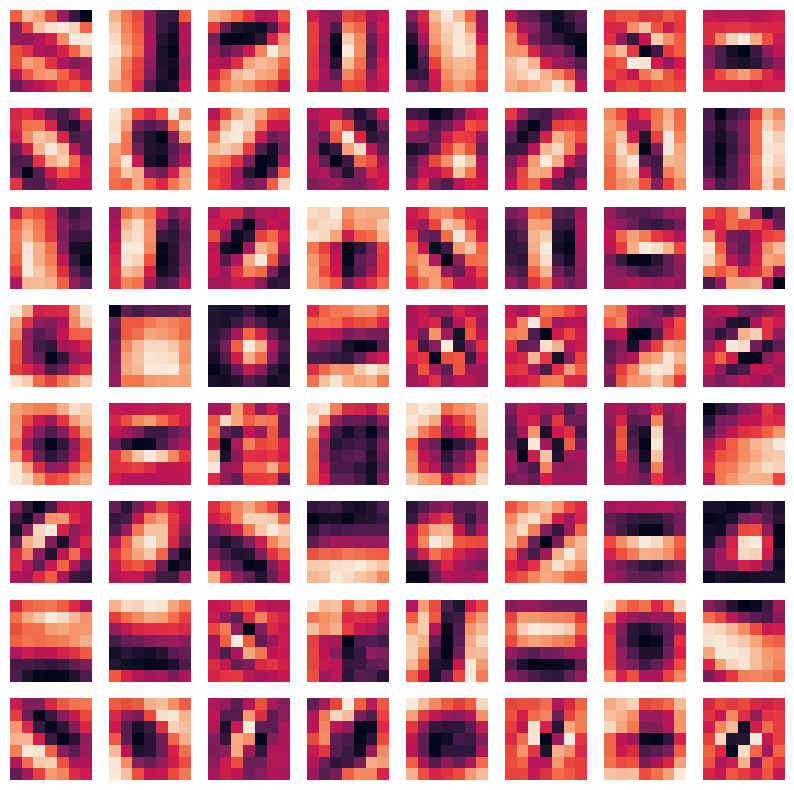

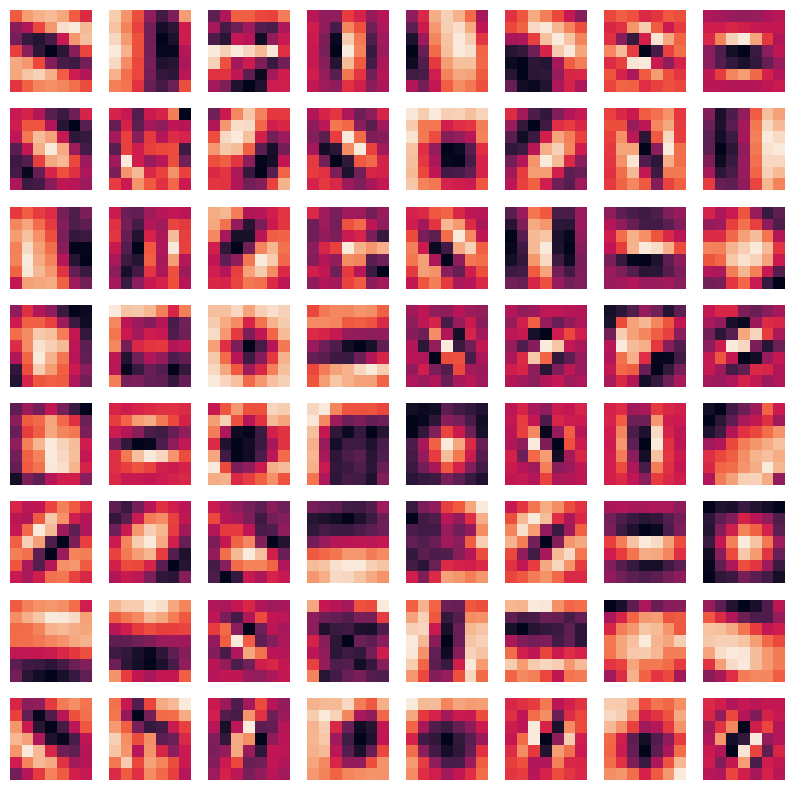

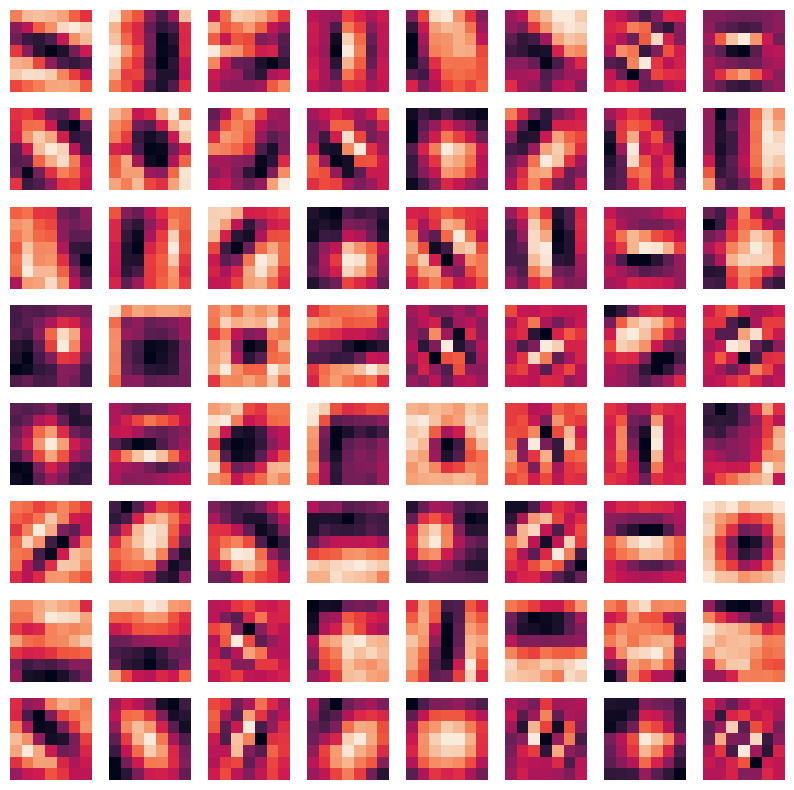

In [9]:
import matplotlib.pyplot as plt
for layer in fine_tuned_resnet_model_freezed.layers:
    # check for convolutional layer
    flag=False
    if 'conv' in layer.name:
        # get filter weights
        filters=layer.get_weights()
        for filter in filters:
            if len(filter.shape)==4 and filter.shape[0]>=3:
                print(layer.name)
                print(filter.shape)
                for k in range(filter.shape[2]):
                    _, axs = plt.subplots(int(filter.shape[3]/8),8, figsize=(10, 10))
                    for i,ax in enumerate(axs.flatten()):
                        ax.imshow(filter[:,:,k,i])
                        ax.grid(False)
                        ax.axis(False)
                flag=True
                break
    if flag :
        break
                # break
    # print(i)

**From this filters visualization we can debug our model to see what type of features it can learn.**

## TSNE clustering

## Reread the data using keras.utils

In [66]:
from keras import utils
test_data_200_loader = utils.image_dataset_from_directory(
                directory='CUB_200_2011/Test',
                seed=seed,
                labels='inferred',
                label_mode='categorical',
                batch_size=128,
                image_size=(photo_size, photo_size))

Found 2366 files belonging to 200 classes.


## Normalize the dataset

In [67]:
def process(image,label):
    image = tf.cast(image/255. ,tf.float32)
    return image,label

test_data_200_loader = test_data_200_loader.map(process)

## Create a flattened model to get the image features representation

In [71]:
layer_idx = -7
from keras import Model
flattened_model=Model(fine_tuned_resnet_model_freezed.inputs,fine_tuned_resnet_model_freezed.layers[layer_idx].output)
flattened_model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_10 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_10[0][0]']               
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

# Infer the models to get the features and predictions to plot the clusters visualization

In [72]:
from sklearn.manifold import TSNE
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
tsne=TSNE(random_state=seed)
image_as_tsne_features=[]
all_predicted_labels=[]
from tqdm import tqdm
for i,batch in enumerate(test_data_200_loader):
    images=batch[0]
    labels=batch[1].numpy().argmax(axis=1)
    features = flattened_model.predict(images)
    tsne_features=tsne.fit_transform(features)
    image_as_tsne_features.append(tsne_features)
    predicted_labels = fine_tuned_resnet_model_freezed.predict(images).argmax(axis=1)
    all_predicted_labels.append(predicted_labels)

2/2 [==============================] - 1s 497ms/step


<Figure size 2000x2000 with 0 Axes>

## Store all features and predictions as np array

In [109]:
all_image_as_tsne_features=[]
all_predicted_labels_flattened=[]
for batch,predicted in zip(image_as_tsne_features,all_predicted_labels) :
    for bt,bt2 in zip(batch,predicted) :
        all_image_as_tsne_features.append(bt)
        all_predicted_labels_flattened.append(bt2)
all_image_as_tsne_features=np.array(all_image_as_tsne_features)
all_predicted_labels_flattened=np.array(all_predicted_labels_flattened)
all_image_as_tsne_features.shape,all_predicted_labels_flattened.shape

((2366, 2), (2366,))

## Scale the features range to using MinmaxScaler

In [110]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
all_image_as_tsne_features=scaler.fit_transform(all_image_as_tsne_features)

## Plot the clusters

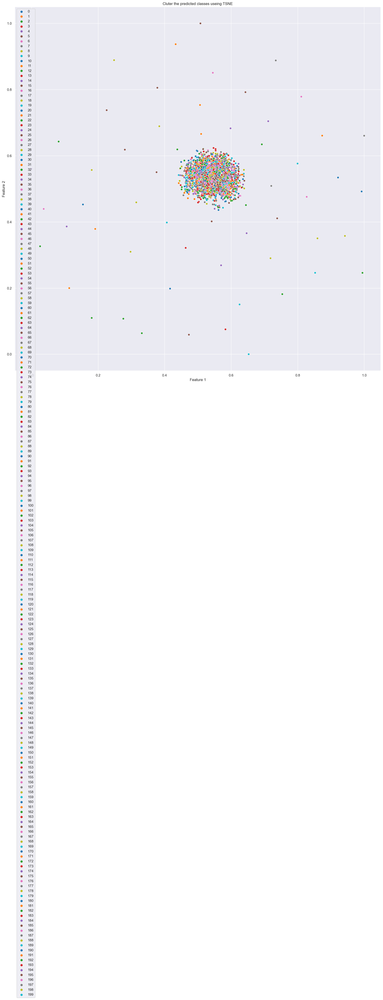

In [152]:
sns.scatterplot(x=all_image_as_tsne_features[:,0],y=all_image_as_tsne_features[:,1],hue=all_predicted_labels_flattened,legend='full',palette='tab10')
sns.set(rc={'figure.figsize':(20.7,20.7),'font.size': 30.7})
sns.set_palette('tab10')
plt.legend(loc="best")
plt.title('Cluter the predicted classes useing TSNE')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.rcParams.update({'font.size': 20})
plt.show()

**There is no clear clusters in this figure and this because our model didn't achieve a high accuracy in the training phase**

## Plot the clusters using the images

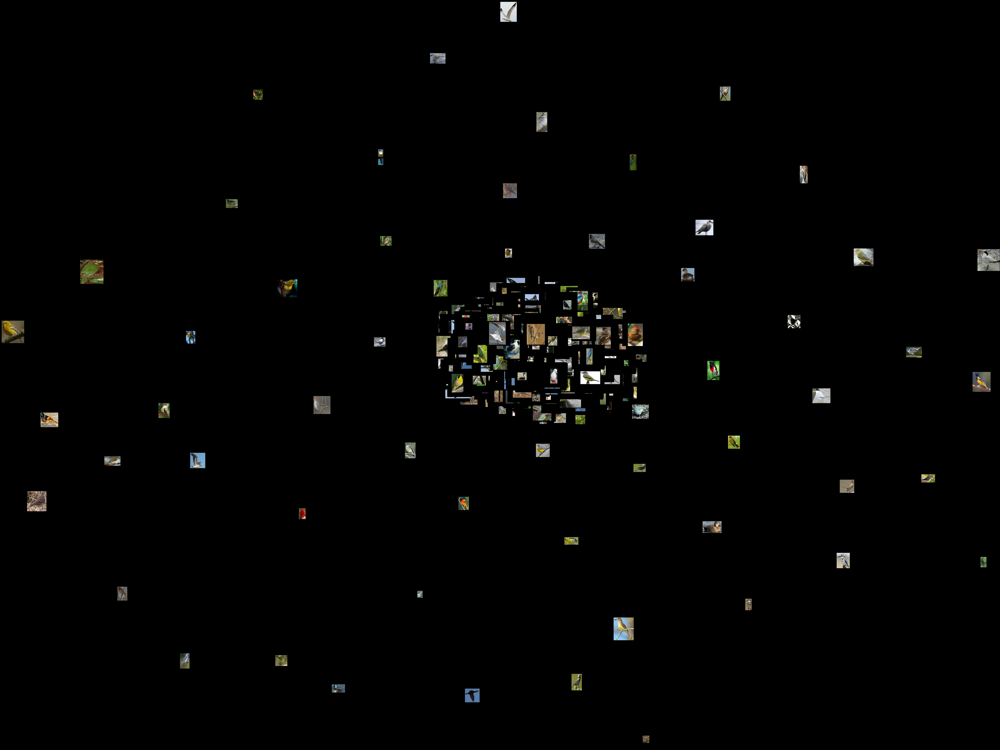

In [113]:
w,h,dim = 4000,3000,100
image = Image.new('RGB', (w, h))

count=0
for batch in test_data_200_loader :
    for x in batch[0]:
        im = Image.fromarray(np.uint8(x * 255))
        im = im.transpose(Image.FLIP_TOP_BOTTOM)
        rs = max(1, im.width / dim, im.height / dim)
        im = im.resize((int(im.width / rs),int(im.height / rs)))
        image.paste(im, (int((w-dim) * all_image_as_tsne_features[:,0][count]),int((h-dim) * all_image_as_tsne_features[:,1][count])))
        count+=1
image = image.transpose(Image.FLIP_TOP_BOTTOM)
image

## Bonus (1 Mark)
Visualize the activation maps produced by your network and discuss the results using an image from the test test and another image of your choice.

In [147]:
from keract import display_activations, get_activations

# The image path
img_path = 'CUB_200_2011/Test/002.Laysan_Albatross/Laysan_Albatross_0001_545.jpg'
# Preprocessing the image for the model
x = Image.open(img_path)
x=x.resize((224,224))
x=np.array(x)
x=np.expand_dims(x,axis=0)
x=x/255.0
print(x.shape)
# Generate the activations
activations = get_activations(fine_tuned_resnet_model_freezed, x)

(1, 224, 224, 3)


## Choose some activations to show
display only the first 7 layers and the last 7

In [148]:
layers_names=list(activations.keys())
chosen_names=[*layers_names[0:7], *layers_names[-7:]]
for name in layers_names :
    if name not in chosen_names:
        activations.pop(name, None)
activations.keys()

odict_keys(['input_10', 'conv1_pad', 'conv1_conv', 'pool1_pad', 'pool1_pool', 'conv2_block1_preact_bn', 'conv2_block1_preact_relu', 'flatten_9', 'batch_normalization_13', 'dense_33', 'dropout_20', 'dense_34', 'dropout_21', 'dense_35'])

input_10 (1, 224, 224, 3) 


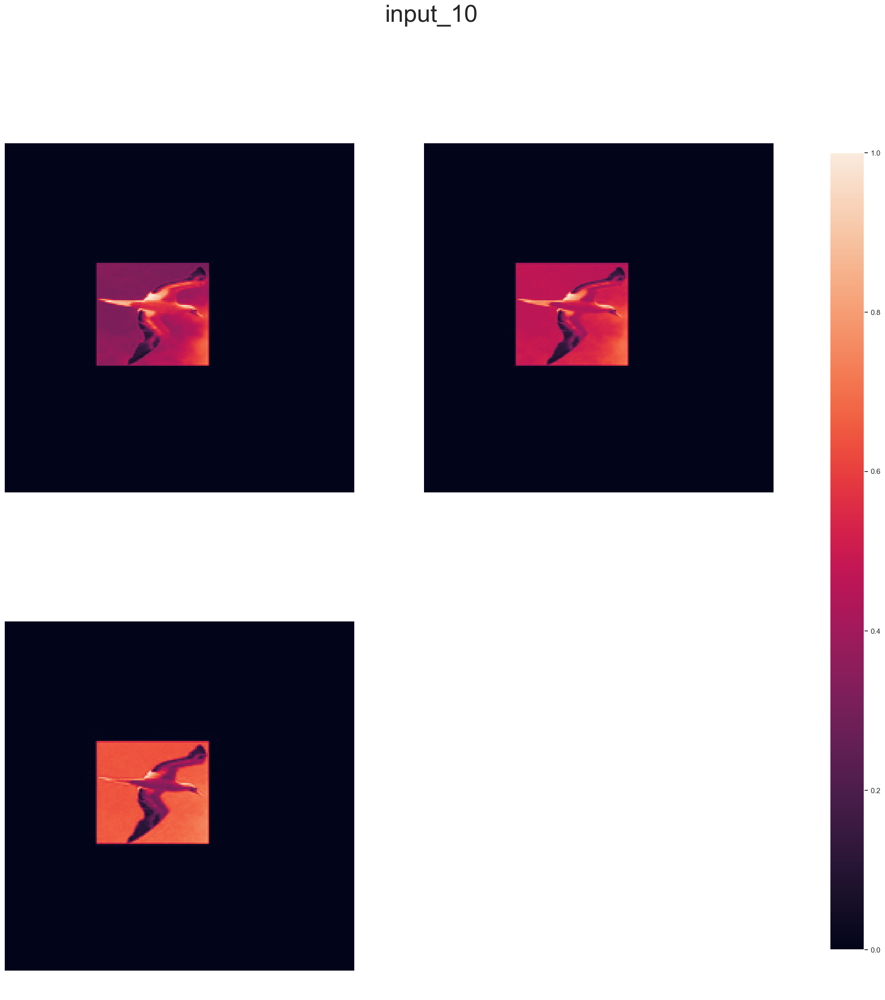

conv1_pad (1, 230, 230, 3) 


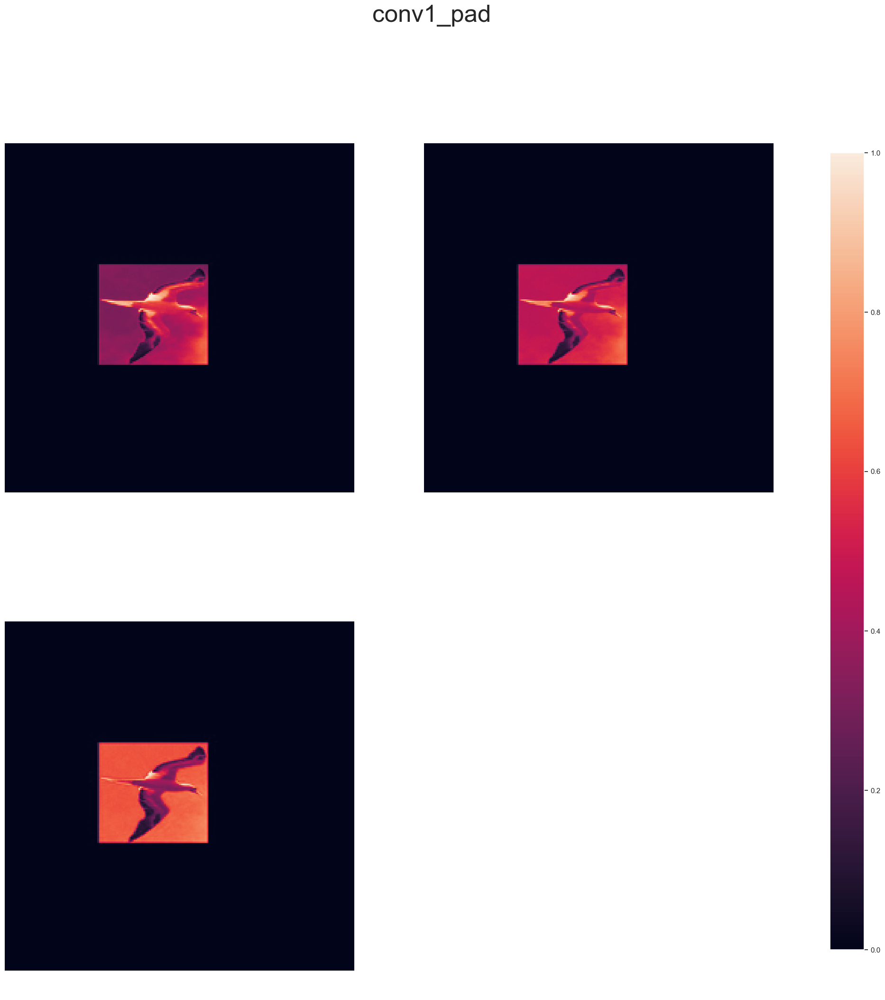

conv1_conv (1, 112, 112, 64) 


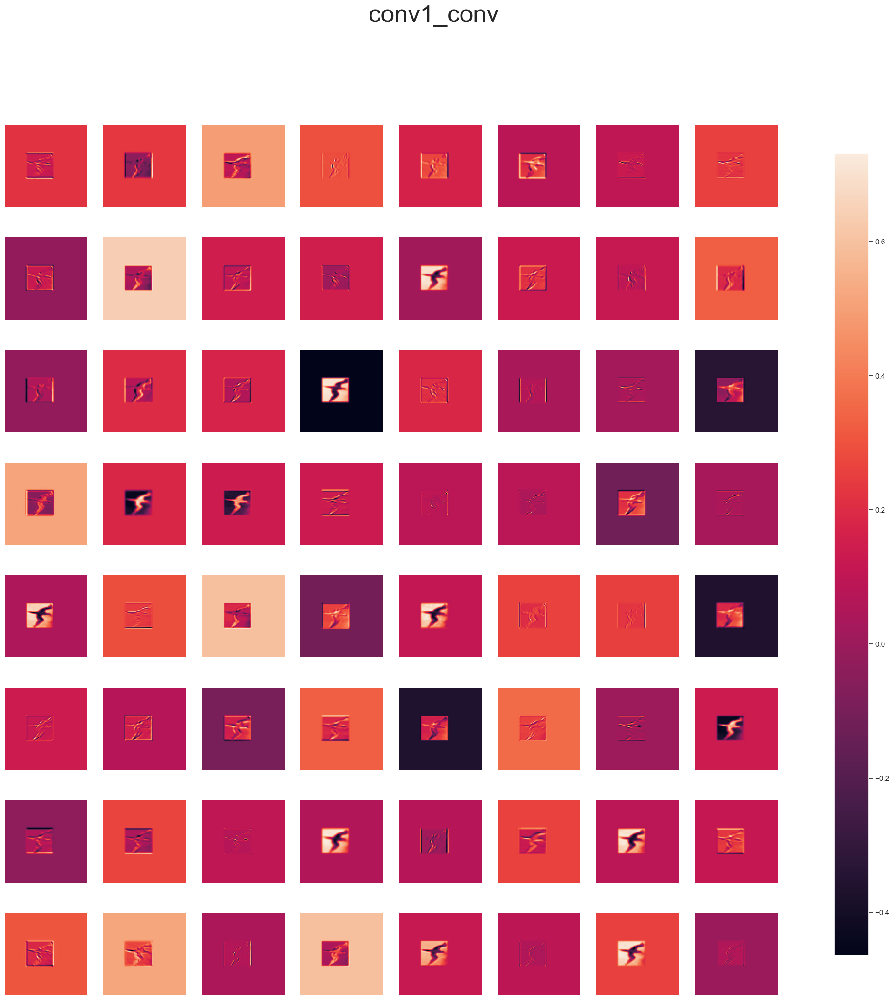

pool1_pad (1, 114, 114, 64) 


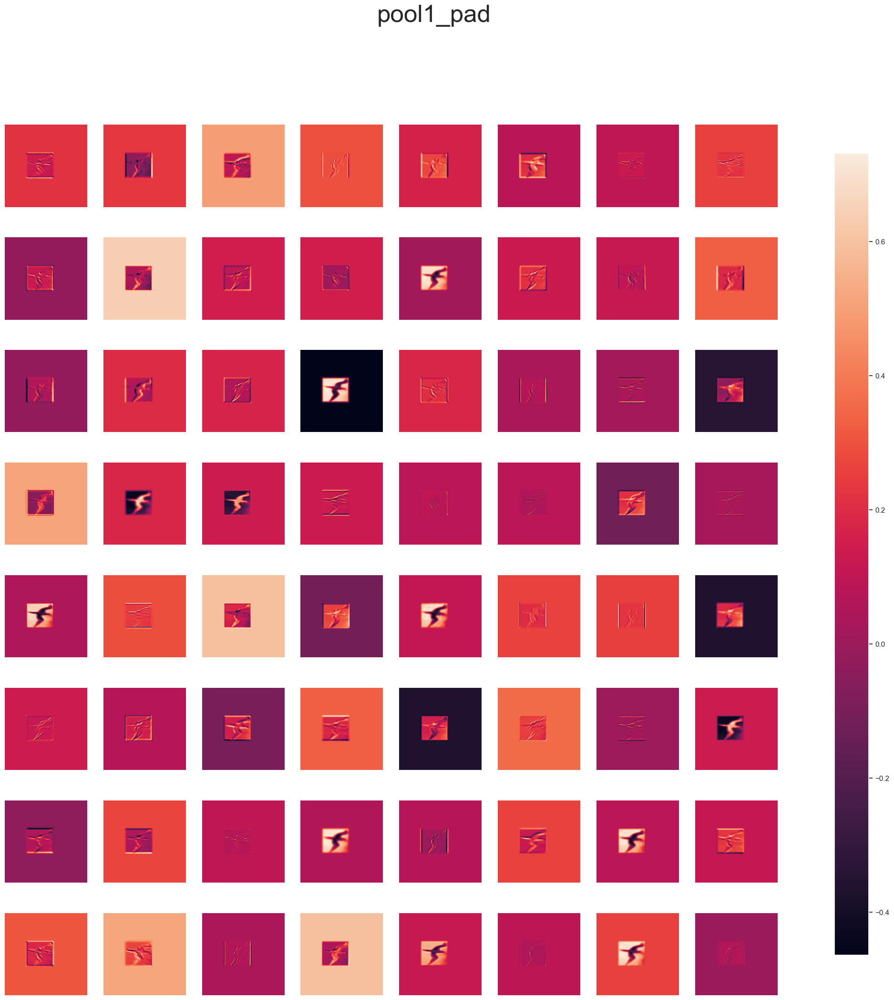

pool1_pool (1, 56, 56, 64) 


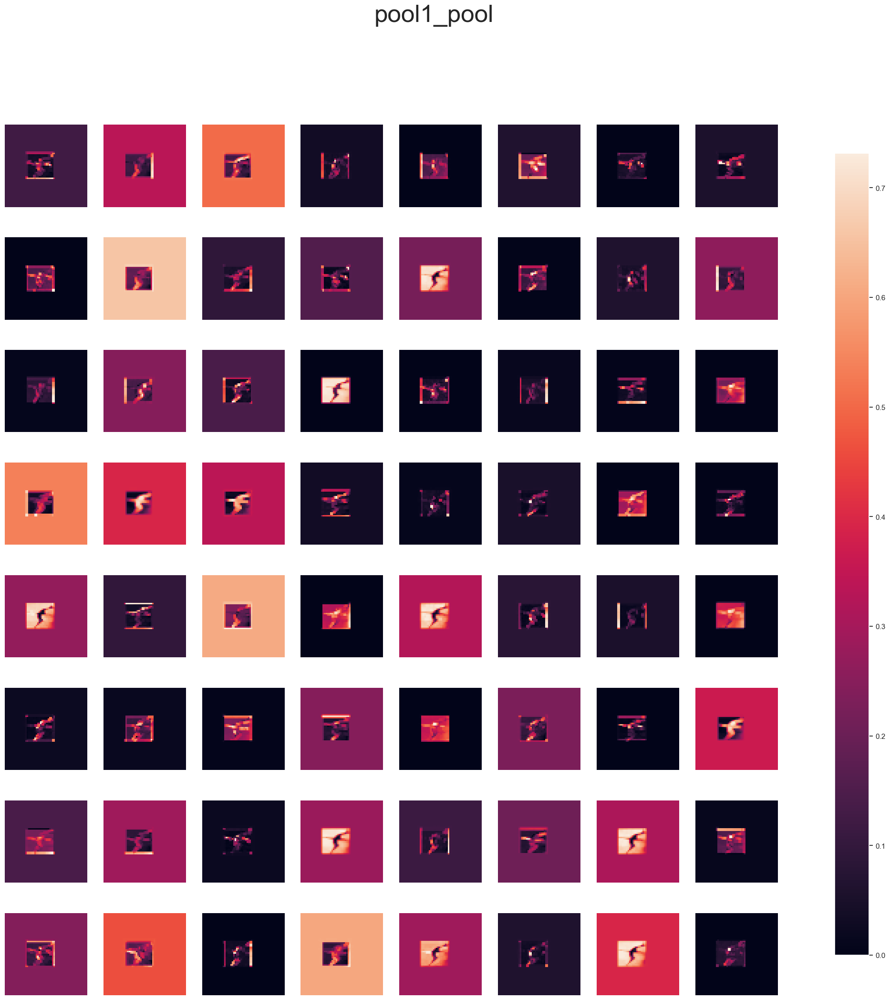

conv2_block1_preact_bn (1, 56, 56, 64) 


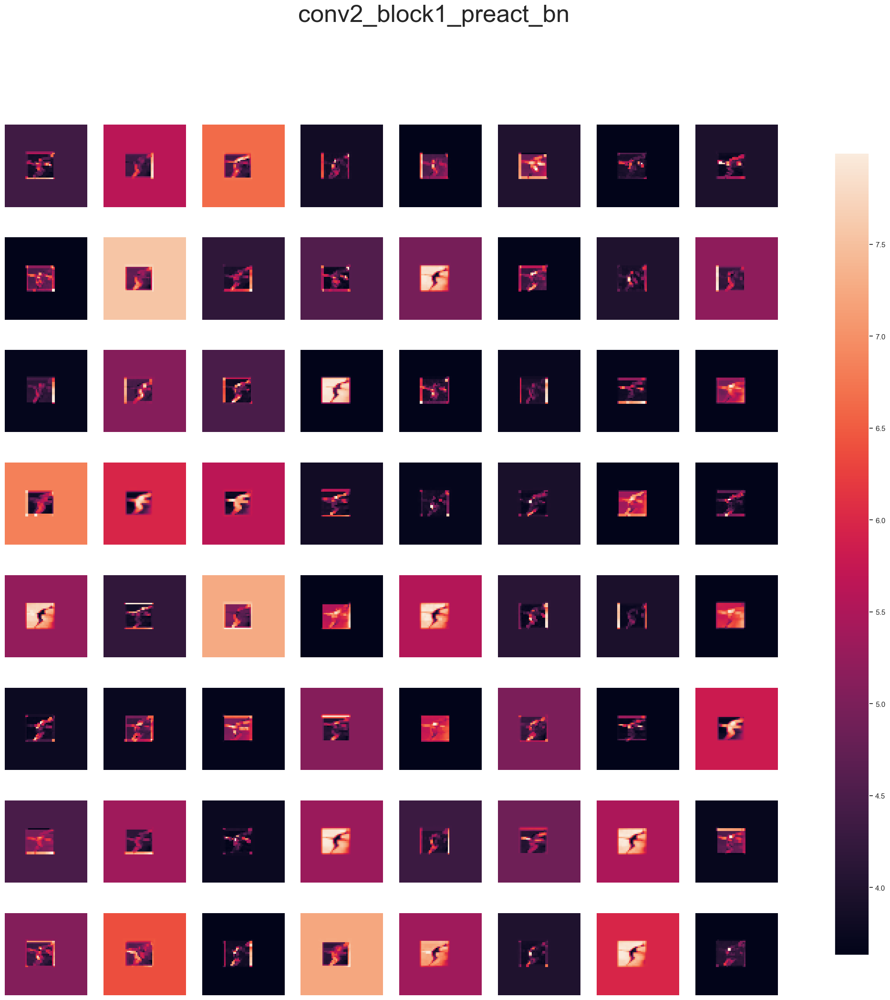

conv2_block1_preact_relu (1, 56, 56, 64) 


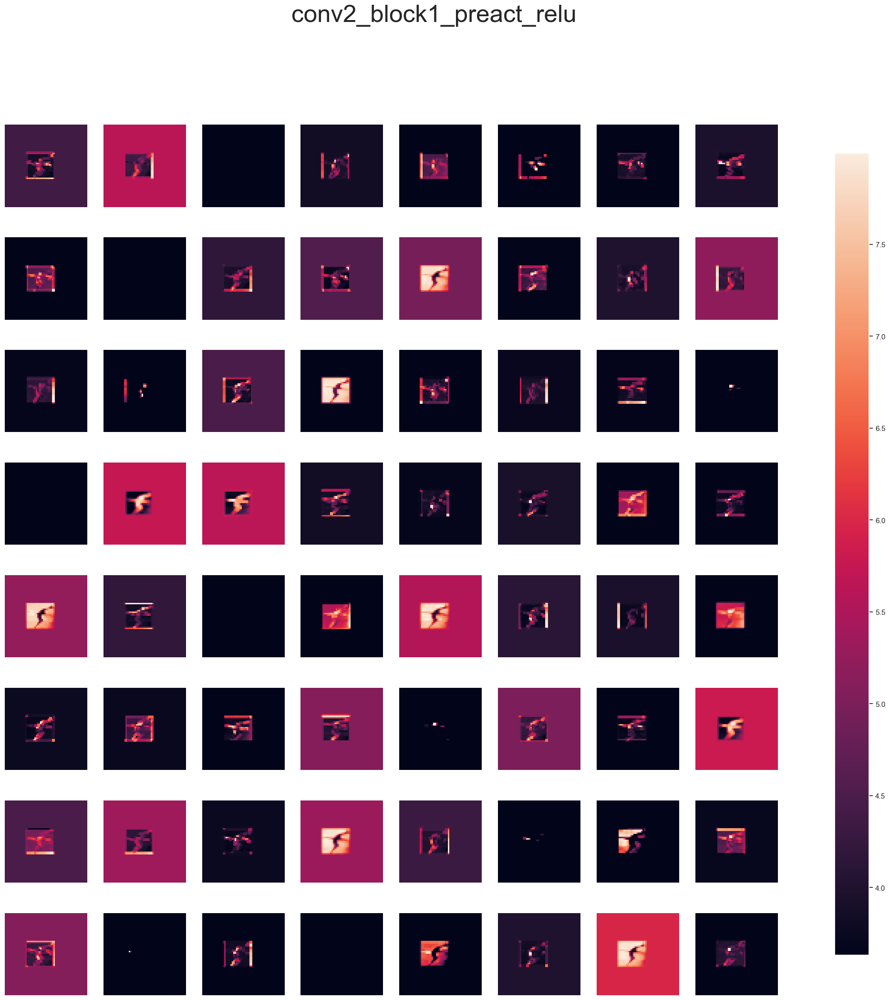

flatten_9 (1, 2048) 


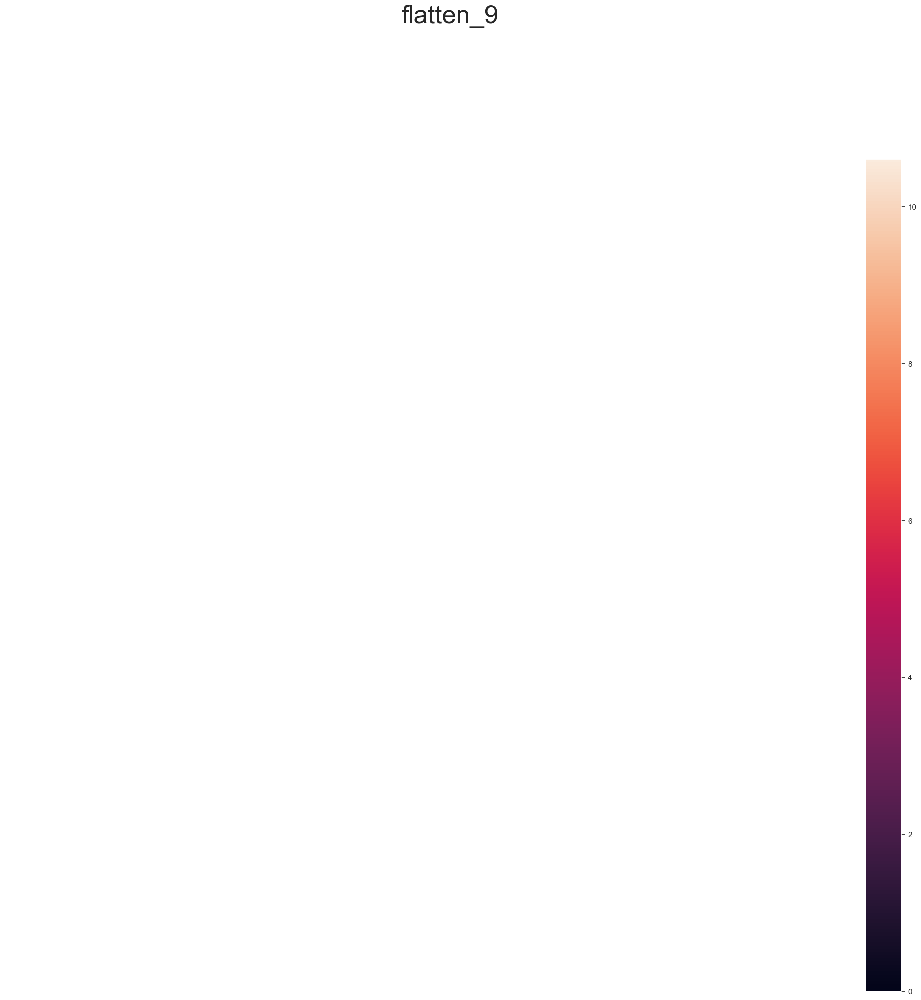

batch_normalization_13 (1, 2048) 


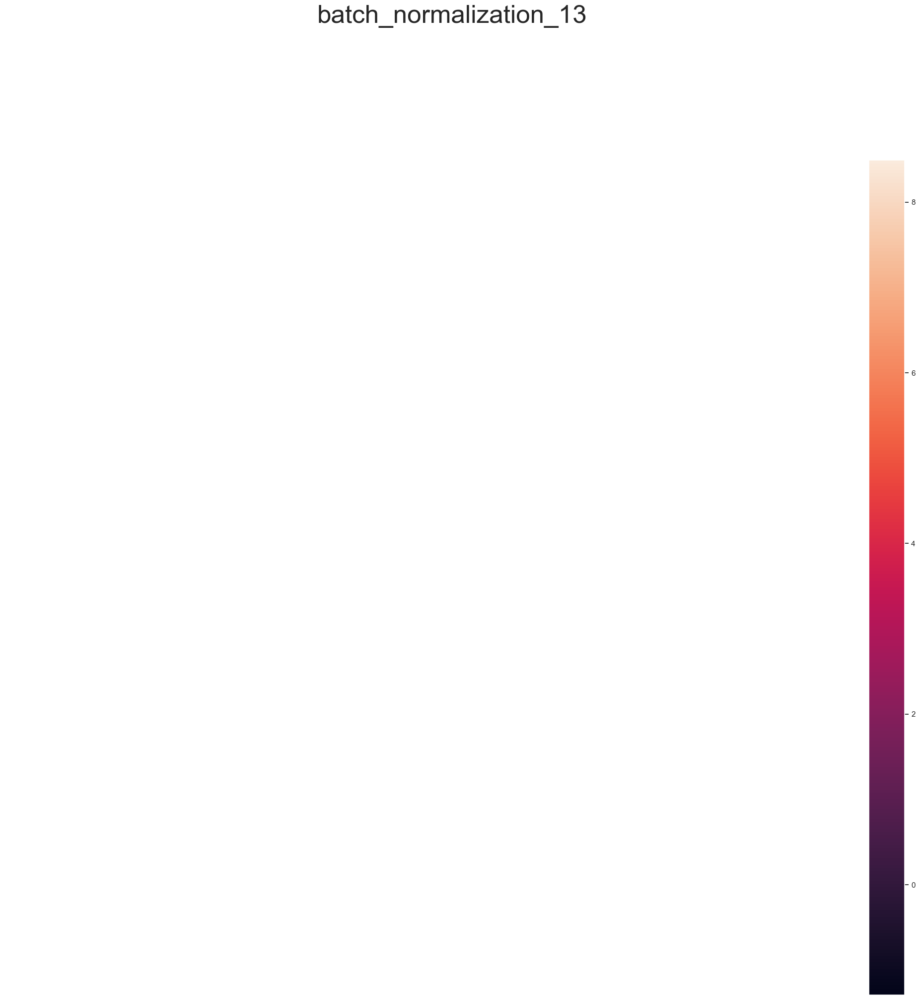

dense_33 (1, 1024) 


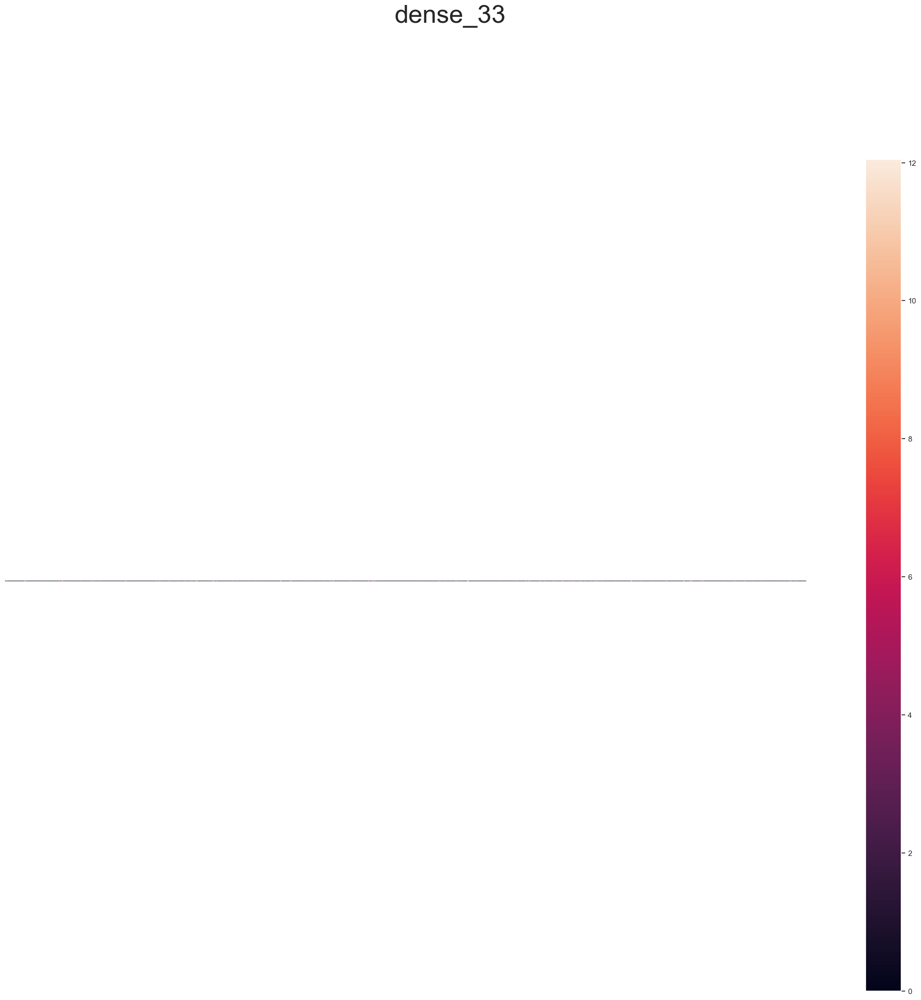

dropout_20 (1, 1024) 


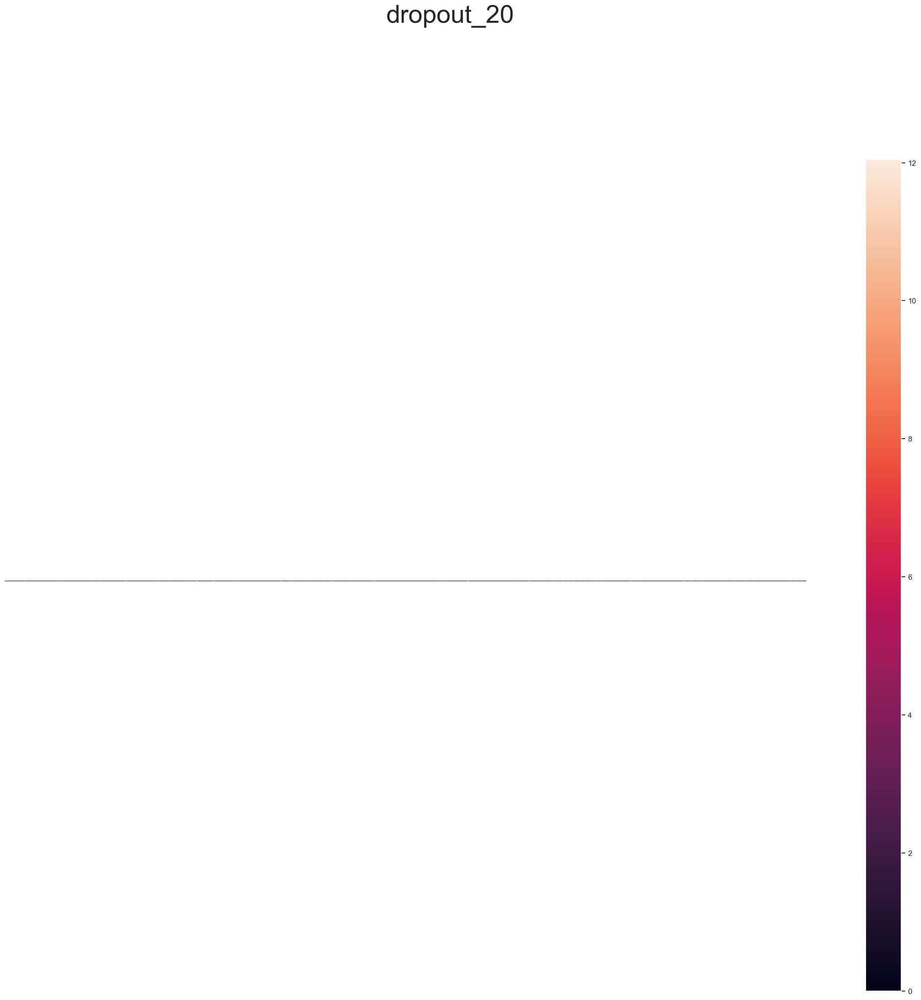

dense_34 (1, 64) 


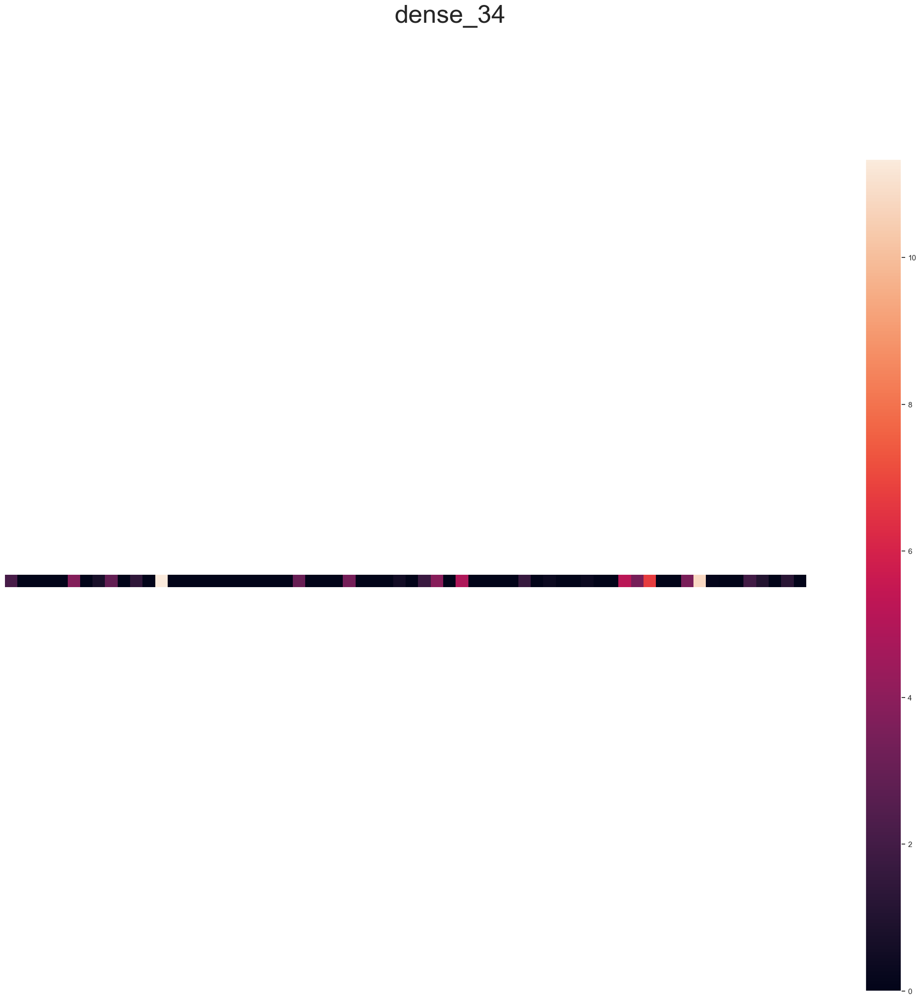

dropout_21 (1, 64) 


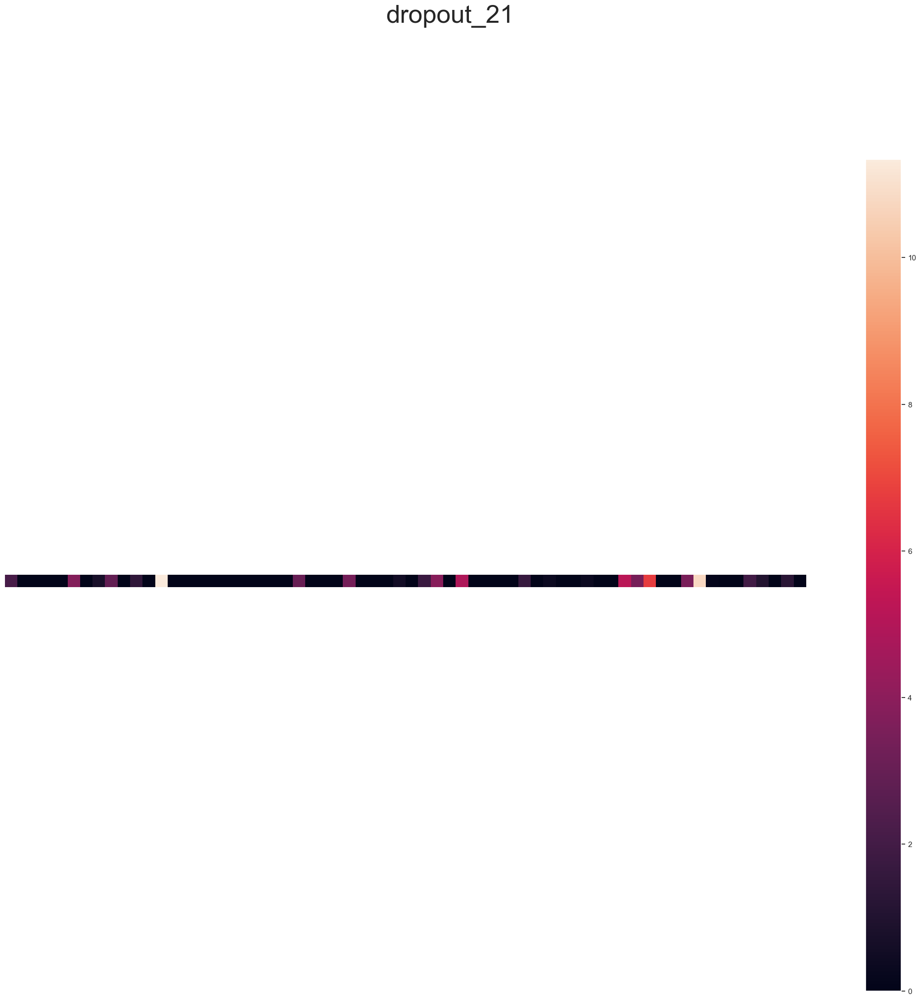

dense_35 (1, 200) 


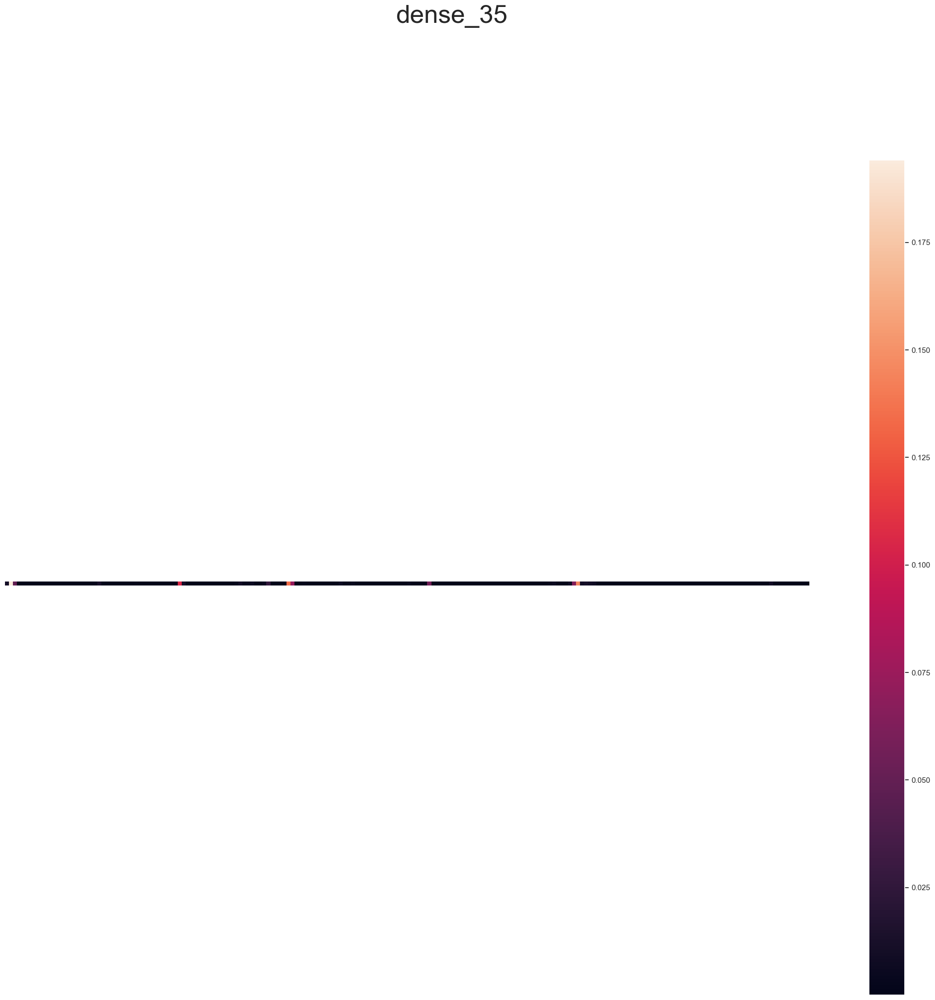

In [149]:
display_activations(activations, save=False,)

**Using this feature map we can trace what our model learned through the layers and debug the prediction**